## 1.Exploratory Data Analysis (EDA)


1.1)   Data Inspection




In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/dataset.csv'
df = pd.read_csv(file_path)

# Inspect the dataset
df_info = df.info()
df_head = df.head()
df_description = df.describe()

# Check for missing values
missing_values = df.isnull().sum()

# Separate numerical and categorical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
print()
print("OVERVIEW AND SOME ENTRIES OF DATASET")
print(df_head)
print()
print("ANALYSIS/BASIC STATISTICS FOR EACH NUMERICAL FEATURE ,INCLUDING RANGE, MEAN MEDIUN,STANDARD DEVIATION, AND QUARTILES")
print(df_description)
print()
print("NUMBER OF MISSING DATA POINTS IN EACH FEATURE")
print(missing_values)
print()
print("ALL COLLUMBS OF NUMERICAL DATA TYPE")
print(numerical_cols)
print()
print("ALL COLLUMBS OF OBJECT/CATORIGICAL DATA TYPE")
print(categorical_cols)

# Handling missing values for numerical columns with mean imputation


meancalucalted=df[numerical_cols].mean()
df[numerical_cols] = df[numerical_cols].fillna(meancalucalted)

# Handling missing values for categorical columns with mode imputation
df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Name                          4534 non-null   int64  
 1   Epoch Date Close Approach     3280 non-null   float64
 2   Relative Velocity km per sec  3184 non-null   object 
 3   Relative Velocity km per hr   3033 non-null   float64
 4   Miles per hour                3668 non-null   float64
 5   Miss Dist.(Astronomical)      3933 non-null   float64
 6   Miss Dist.(lunar)             3417 non-null   float64
 7   Miss Dist.(kilometers)        3166 non-null   float64
 8   Miss Dist.(miles)             3882 non-null   float64
 9   Jupiter Tisserand Invariant   2802 non-null   float64
 10  Epoch Osculation              3007 non-null   float64
 11  Semi Major Axis               3346 non-null   float64
 12  Asc Node Longitude            3438 non-null   float64
 13  Per

1.2 Statistical Inference



*   plotting histograms






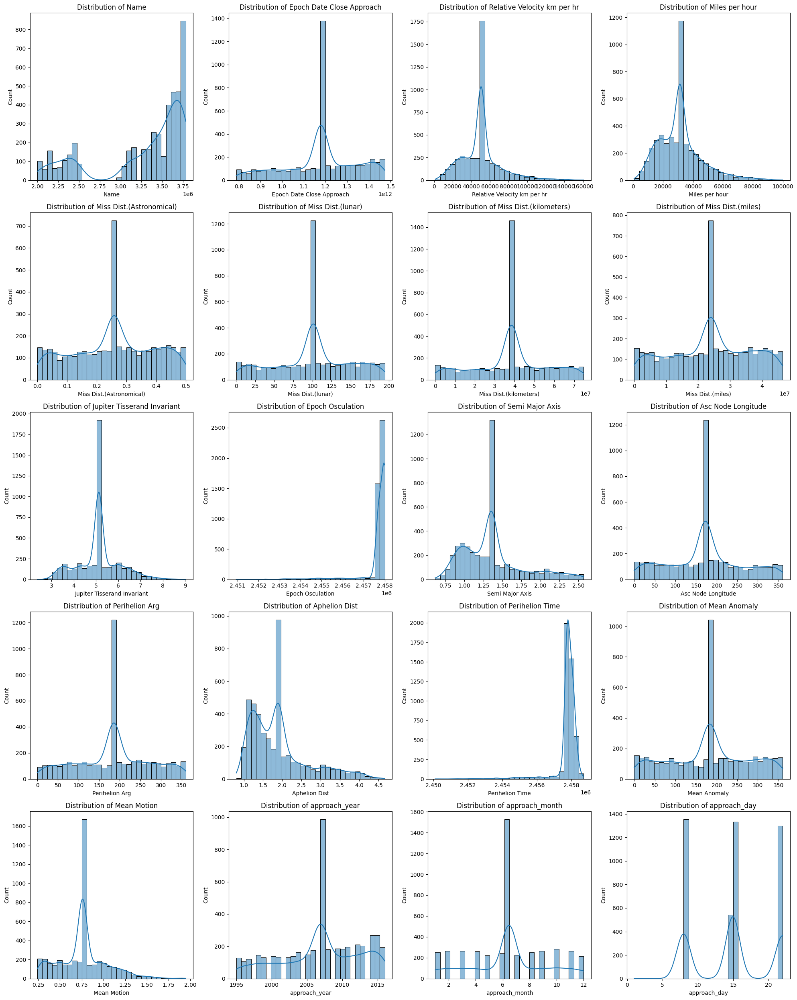

,proportion
Hazardous,
False,83.767093
True,16.232907


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot histograms for numerical columns to assess skewness
fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(20, 25))
axs = axs.flatten()

for i, col in enumerate(numerical_cols):
    sns.histplot(df[col], kde=True, ax=axs[i], bins=30)
    axs[i].set_title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

# Check for class imbalance in the "Hazardous" column
class_balance = df['Hazardous'].value_counts(normalize=True) * 100
class_balance




*   normalization in the numerical coloumns



In [ ]:
from sklearn.preprocessing import StandardScaler

# List of numerical features that need normalization

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling only to the numerical columns
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# Display the first few rows of the scaled DataFrame to confirm normalization
print(df[numerical_cols].head())


       Name  Epoch Date Close Approach  Relative Velocity km per hr  \
0  0.787436              -2.308393e+00                    -1.313654   
1  0.825271              -1.445153e-15                     0.677264   
2 -1.489416              -2.304813e+00                    -1.068919   
3 -0.319208              -2.301233e+00                    -0.474346   
4  0.446183              -2.301233e+00                    -0.695545   

   Miles per hour  Miss Dist.(Astronomical)  Miss Dist.(lunar)  \
0       -1.196486              1.185503e+00           1.263972   
1        0.624759              4.080864e-16           0.000000   
2       -0.972609             -1.523694e+00          -1.636658   
3       -0.428707              4.080864e-16           0.000000   
4        0.000000              1.099856e+00           1.172273   

   Miss Dist.(kilometers)  Miss Dist.(miles)  Jupiter Tisserand Invariant  \
0            1.319149e+00           1.200728                 9.439265e-16   
1            1.023346e



*   outilier detection and their realtion



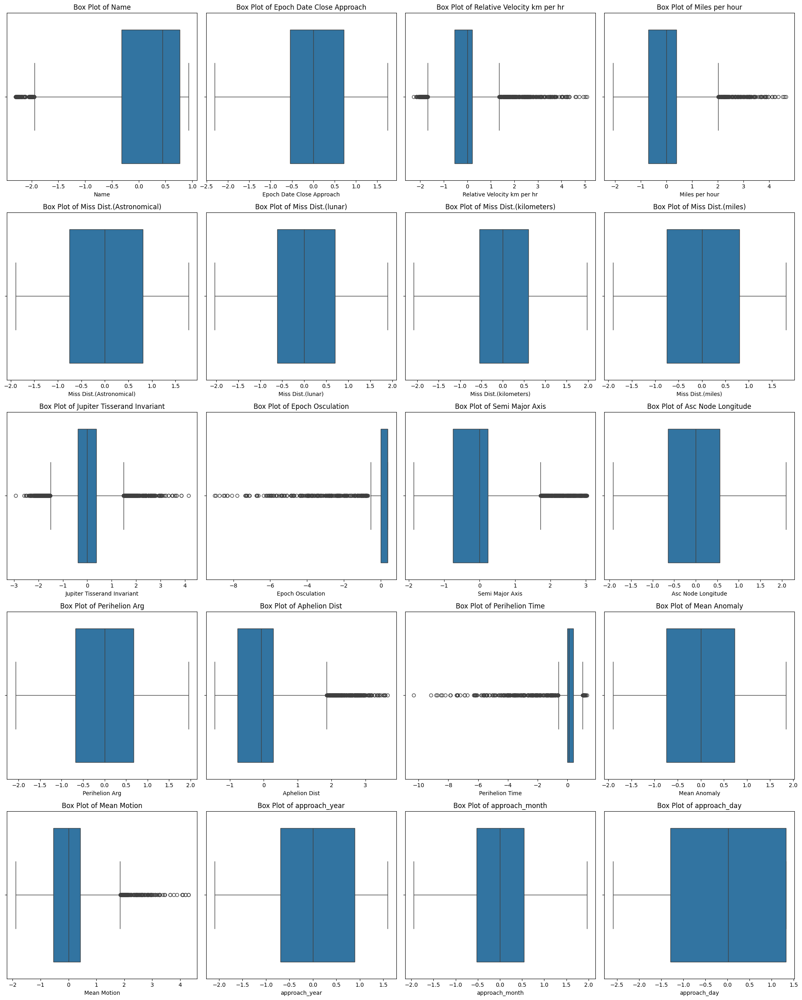

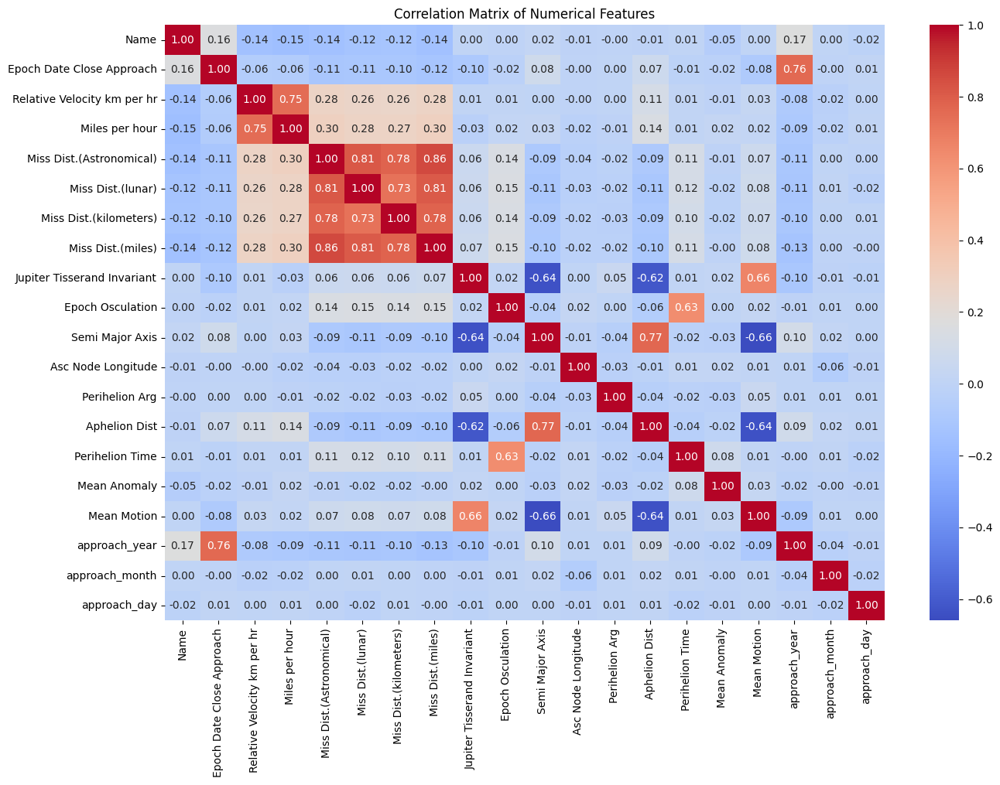

In [ ]:
# Outlier detection using box plots for numerical columns
fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(20, 25))
axs = axs.flatten()

for i, col in enumerate(numerical_cols):
    sns.boxplot(data=df, x=col, ax=axs[i])
    axs[i].set_title(f'Box Plot of {col}')

plt.tight_layout()
plt.show()

# Correlation matrix to explore relationships between numerical features
corr_matrix = df[numerical_cols].corr()

# Plot the correlation matrix
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix of Numerical Features")
plt.show()


1.3 Visualisation

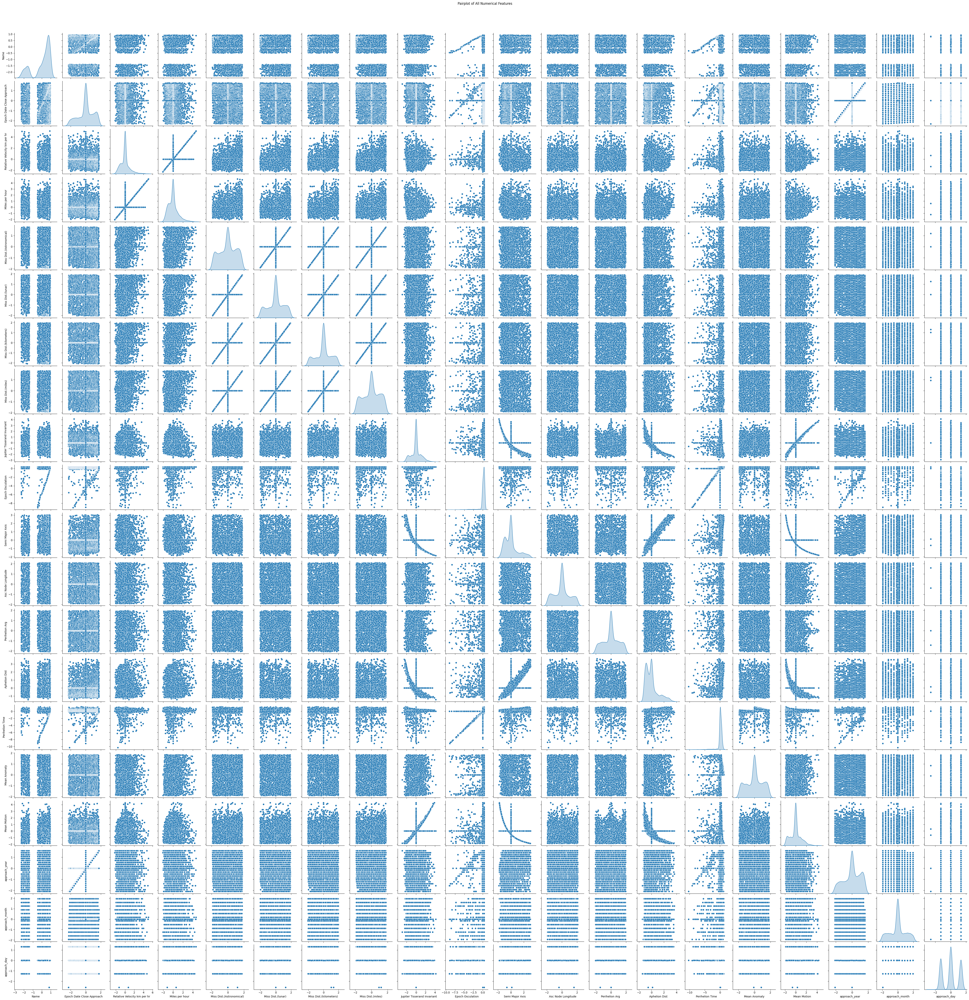

In [ ]:
# Generate the pairplot for all numerical features
sns.pairplot(df[numerical_cols], diag_kind='kde')
plt.suptitle('Pairplot of All Numerical Features', y=1.02)
plt.show()


## 2.Numerical Interpretation and Mathematical Analysis



2.1   feature engineering







*   ‘datetime’ format.



In [ ]:
import numpy as np
from datetime import datetime

# Assuming df is your DataFrame and 'Epoch Date Close Approach' exists
# Convert 'Epoch Date Close Approach' to datetime format
df['Approach Date'] = pd.to_datetime(df['Epoch Date Close Approach'], unit='s')

# 1. Create a feature representing the day of the year
df['day_of_year'] = df['Approach Date'].dt.dayofyear

# Display the newly created features
print(df[['Approach Date', 'day_of_year']].head())


                  Approach Date  day_of_year
0 1969-12-31 23:59:57.691607326          365
1 1970-01-01 00:00:00.000000000            1
2 1969-12-31 23:59:57.695187347          365
3 1969-12-31 23:59:57.698767369          365
4 1969-12-31 23:59:57.698767369          365






*   claculating new features








In [ ]:
# Assuming df is your DataFrame and has the necessary columns

# Convert 'Epoch Date Close Approach' to datetime format
df['Approach Date'] = pd.to_datetime(df['Epoch Date Close Approach'], unit='s')

# 1. Create a feature representing the day of the year
df['day_of_year'] = df['Approach Date'].dt.dayofyear

# 2. Calculate the ratio of Miss Distance vs. Semi-major axis
df['miss_distance_ratio'] = pd.to_numeric(df['Miss Dist.(kilometers)'], errors='coerce') / pd.to_numeric(df['Semi Major Axis'], errors='coerce')

# Create 'Time Until Approach' feature based on the difference between the current date and 'Epoch Date Close Approach'
current_date = pd.to_datetime(datetime.now())
df['Time Until Approach'] = (df['Approach Date'] - current_date).dt.days
# mapping orbital periods to convert it into integers  from string
orbital_period_mapping = {
    'Low': 365,    # 1 year
    'Medium': 730, # 2 years
    'High': 1825   # 5 years
}

df['Orbital Period (days)'] = df['Orbital Period'].map(orbital_period_mapping)

# 3. Calculate eccentricity, average orbital velocity, and orbital period using Kepler’s Law
df['eccentricity'] = np.sqrt(1 - (df['Semi Major Axis'] ** 2))  # Adjust if needed
df['Semi Major Axis'].fillna(df['Semi Major Axis'].mean(), inplace=True)
df['Orbital Period (days)'].fillna(df['Orbital Period (days)'].mean(), inplace=True)

df['average_orbital_velocity'] = 2 * np.pi * pd.to_numeric(df['Semi Major Axis']) / pd.to_numeric(df['Orbital Period (days)'], errors='coerce')  # Placeholder

# 4. Calculate heliocentric distance, escape velocity, and specific orbital energy
M = 1.989e30  # kg, mass of the sun
G = 6.67430e-11  # m^3 kg^-1 s^-2, gravitational constant
df['heliocentric_distance'] = pd.to_numeric(df['Semi Major Axis'], errors='coerce') * 1.496e11  # Convert AU to meters
df['escape_velocity'] = np.sqrt(2 * G * M / df['heliocentric_distance'])

# Specific orbital energy (energy per unit mass) = -GM/(2a)
df['specific_orbital_energy'] = -G * M / (2 * pd.to_numeric(df['Semi Major Axis'], errors='coerce'))

# 5. Calculate Specific Angular Momentum
df['specific_angular_momentum'] = np.sqrt(G * M * pd.to_numeric(df['Semi Major Axis'], errors='coerce') * (1 - df['eccentricity']**2))

# 6. Calculate velocity at Perihelion and Aphelion
df['velocity_perihelion'] = df['average_orbital_velocity'] * (1 + df['eccentricity'])
df['velocity_aphelion'] = df['average_orbital_velocity'] * (1 - df['eccentricity'])

# 7. Average the Miss distance of various categories and find the closest approach distance
if 'Class' in df.columns:
    average_miss_distance = df.groupby('Class')['Miss Dist.(kilometers)'].mean()
else:
    average_miss_distance = df['Miss Dist.(kilometers)'].mean()

closest_approach_distance = df['Miss Dist.(kilometers)'].min()

# 8. Calculate Synodic Period and Mean Motion using the orbital period
orbital_period_mapping = {
    'Low': 365,    # 1 year
    'Medium': 730, # 2 years
    'High': 1825   # 5 years
}

# Map the values
df['Orbital Period (days)'] = df['Orbital Period'].map(orbital_period_mapping)

# Define the Earth's orbital period
P_earth = 365  # days

# Calculate Synodic Period
df['synodic_period'] = 1 / (1 / df['Orbital Period (days)'] - 1 / P_earth)

# Calculate Mean Motion
df['mean_motion'] = 360 / df['Orbital Period (days)']


# Display the modified DataFrame
print(df[['Approach Date', 'day_of_year', 'miss_distance_ratio', 'Time Until Approach', 'eccentricity',
           'average_orbital_velocity', 'heliocentric_distance', 'escape_velocity', 'specific_orbital_energy',
           'specific_angular_momentum', 'velocity_perihelion', 'velocity_aphelion',
           'synodic_period', 'mean_motion']].head())


                  Approach Date  day_of_year  miss_distance_ratio  \
0 1969-12-31 23:59:57.691607326          365            10.810682   
1 1970-01-01 00:00:00.000000000            1            -1.632958   
2 1969-12-31 23:59:57.695187347          365            -6.636219   
3 1969-12-31 23:59:57.698767369          365                  inf   
4 1969-12-31 23:59:57.698767369          365            -3.690454   

   Time Until Approach  eccentricity  average_orbital_velocity  \
0               -20014      0.992527                  0.002101   
1               -20014      0.779275                 -0.010788   
2               -20014      0.967815                  0.002166   
3               -20014      1.000000                  0.000000   
4               -20014      0.943335                 -0.005712   

   heliocentric_distance  escape_velocity  specific_orbital_energy  \
0           1.825460e+10     1.206005e+05            -5.439634e+20   
1          -9.375168e+10              NaN       

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-11-65f95a68b14c>:26: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Semi Major Axis'].fillna(df['Semi Major Axis'].mean(), inplace=True)
<ipython-input-11-65f95a68b14c>:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 39 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Name                          4534 non-null   float64       
 1   Epoch Date Close Approach     4534 non-null   float64       
 2   Relative Velocity km per sec  4534 non-null   object        
 3   Relative Velocity km per hr   4534 non-null   float64       
 4   Miles per hour                4534 non-null   float64       
 5   Miss Dist.(Astronomical)      4534 non-null   float64       
 6   Miss Dist.(lunar)             4534 non-null   float64       
 7   Miss Dist.(kilometers)        4534 non-null   float64       
 8   Miss Dist.(miles)             4534 non-null   float64       
 9   Jupiter Tisserand Invariant   4534 non-null   float64       
 10  Epoch Osculation              4534 non-null   float64       
 11  Semi Major Axis               

2.2 taking new feature

In [ ]:
df['velocity_to_escape_ratio'] = df['Relative Velocity km per hr'] / df['escape_velocity']
#filling it's missing values by calculating the mean of known value of this feature
df['velocity_to_escape_ratio']=df['velocity_to_escape_ratio'].fillna(df['velocity_to_escape_ratio'].mean())
df['velocity_to_escape_ratio']

,velocity_to_escape_ratio
0,-1.089261e-05
1,5.330045e-07
2,-1.272868e-05
3,-0.000000e+00
4,5.330045e-07
...,...
4529,5.330045e-07
4530,-0.000000e+00
4531,-1.757286e-05
4532,0.000000e+00


## 3. handling binded values

In [ ]:
mapping = {
    'Very Slow': 0,
    'Slow': 1,
    'Fast': 2,
    'Very Fast': 3
}
#mapping the ordinal values of "relative velocity km per sec"
df['Relative Velocity km per sec'] = df['Relative Velocity km per sec'].map(mapping)
# # One-Hot Encode Non-Ordinal Features: Orbit Uncertainty
df = pd.get_dummies(df, columns=['Orbit Uncertainity'], drop_first=True)
df = pd.get_dummies(df, columns=['Orbital Period'], drop_first=True)
# Display the modified DataFrame
df[["Orbit Uncertainity_Medium", "Orbit Uncertainity_Low"]] = df[["Orbit Uncertainity_Medium", "Orbit Uncertainity_Low"]].astype(int)
df[["Orbital Period_Medium", "Orbital Period_Low"]] = df[["Orbital Period_Medium", "Orbital Period_Low"]].astype(int)
print(df[["Relative Velocity km per sec","Orbit Uncertainity_Medium","Orbit Uncertainity_Low","Orbital Period_Medium","Orbital Period_Low"]])


      Relative Velocity km per sec  Orbit Uncertainity_Medium  \
0                                0                          1   
1                                1                          0   
2                                1                          0   
3                                0                          1   
4                                0                          0   
...                            ...                        ...   
4529                             1                          0   
4530                             0                          0   
4531                             0                          0   
4532                             1                          0   
4533                             3                          1   

      Orbit Uncertainity_Low  Orbital Period_Medium  Orbital Period_Low  
0                          0                      0                   1  
1                          1                      0                   1

preparing the data for classifier

In [ ]:
# droping strings or infinity values coloumns
df2=df.drop(columns=['Hazardous', 'Name','Approach Date', 'day_of_year', 'miss_distance_ratio', 'Time Until Approach', 'eccentricity',
           'average_orbital_velocity', 'heliocentric_distance', 'escape_velocity', 'specific_orbital_energy',
           'specific_angular_momentum', 'velocity_perihelion', 'velocity_aphelion',
           'synodic_period', 'mean_motion',"Orbital Period_Medium", "Orbital Period_Low","Orbit Uncertainity_Low","Orbit Uncertainity_Medium","escape_velocity","synodic_period"])
df2.info()
from sklearn.preprocessing import StandardScaler

# List of numerical features that need normalization

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling only to the numerical columns
df2 = scaler.fit_transform(df2)

# Display the first few rows of the scaled DataFrame to confirm normalization
print(df2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Epoch Date Close Approach     4534 non-null   float64
 1   Relative Velocity km per sec  4534 non-null   int64  
 2   Relative Velocity km per hr   4534 non-null   float64
 3   Miles per hour                4534 non-null   float64
 4   Miss Dist.(Astronomical)      4534 non-null   float64
 5   Miss Dist.(lunar)             4534 non-null   float64
 6   Miss Dist.(kilometers)        4534 non-null   float64
 7   Miss Dist.(miles)             4534 non-null   float64
 8   Jupiter Tisserand Invariant   4534 non-null   float64
 9   Epoch Osculation              4534 non-null   float64
 10  Semi Major Axis               4534 non-null   float64
 11  Asc Node Longitude            4534 non-null   float64
 12  Perihelion Arg                4534 non-null   float64
 13  Aph

## 4.Hazardous Classification

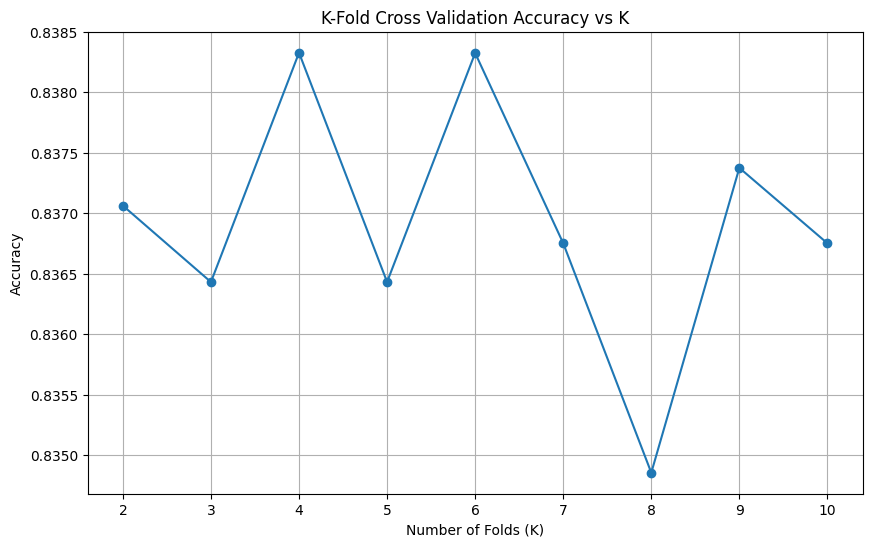

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}


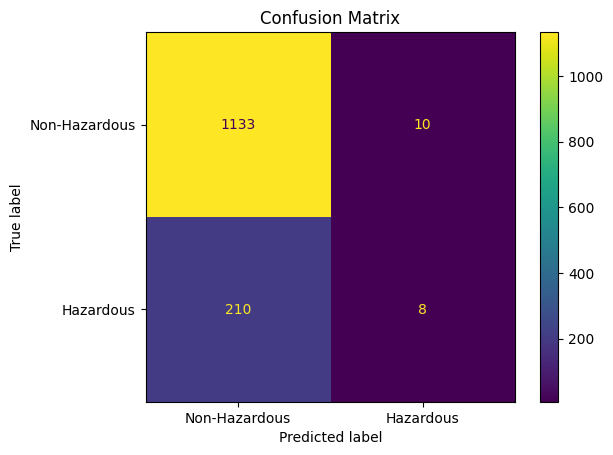

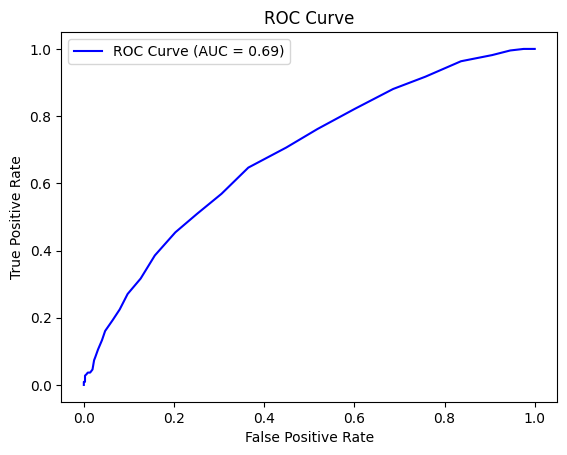

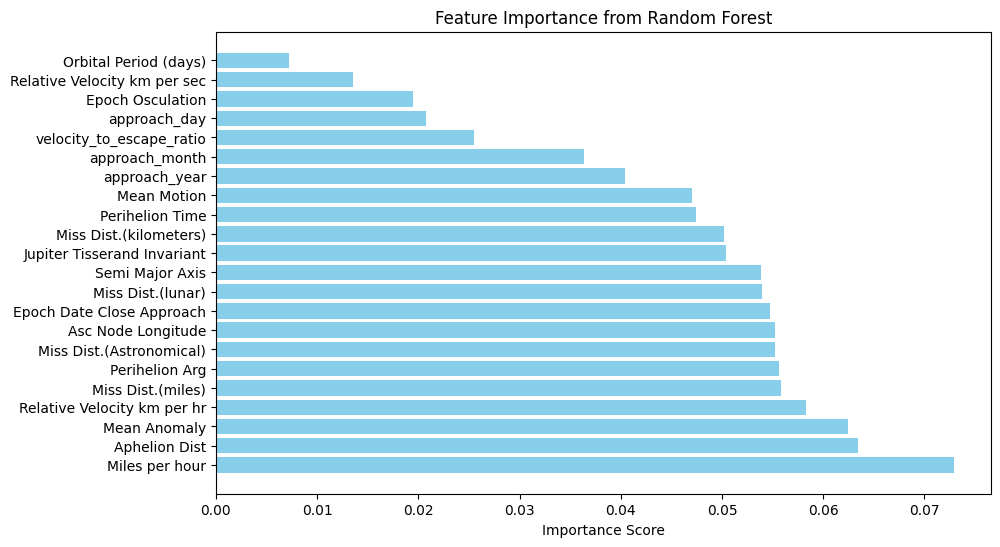

                         Feature  Importance
3                 Miles per hour    0.072914
13                 Aphelion Dist    0.063389
15                  Mean Anomaly    0.062480
2    Relative Velocity km per hr    0.058334
7              Miss Dist.(miles)    0.055821
12                Perihelion Arg    0.055675
4       Miss Dist.(Astronomical)    0.055252
11            Asc Node Longitude    0.055226
0      Epoch Date Close Approach    0.054743
5              Miss Dist.(lunar)    0.053991
10               Semi Major Axis    0.053842
8    Jupiter Tisserand Invariant    0.050403
6         Miss Dist.(kilometers)    0.050195
14               Perihelion Time    0.047407
16                   Mean Motion    0.047043
17                 approach_year    0.040411
18                approach_month    0.036362
21      velocity_to_escape_ratio    0.025507
19                  approach_day    0.020770
9               Epoch Osculation    0.019465
1   Relative Velocity km per sec    0.013554
20        

In [ ]:

from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Assuming df is your DataFrame and 'Hazardous' is the target variable
# Define feature set (X) and target variable (y)
X =df.drop(columns=['Hazardous', 'Name','Approach Date', 'day_of_year', 'miss_distance_ratio', 'Time Until Approach', 'eccentricity',
           'average_orbital_velocity', 'heliocentric_distance', 'escape_velocity', 'specific_orbital_energy',
           'specific_angular_momentum', 'velocity_perihelion', 'velocity_aphelion',
           'synodic_period', 'mean_motion',"Orbital Period_Medium", "Orbital Period_Low","Orbit Uncertainity_Low","Orbit Uncertainity_Medium","escape_velocity","synodic_period"])    # Exclude non-feature columns
y = df['Hazardous']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 1. Build a Random Forest Classifier
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)

# 2. K-Fold Cross Validation
k_values = range(2, 11)
accuracies = []

for k in k_values:
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    fold_accuracies = []
    for train_index, val_index in kf.split(X_train):
        X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
        y_fold_train, y_fold_val = y_train.iloc[train_index], y_train.iloc[val_index]

        rf_clf.fit(X_fold_train, y_fold_train)
        val_preds = rf_clf.predict(X_fold_val)
        fold_accuracy = accuracy_score(y_fold_val, val_preds)
        fold_accuracies.append(fold_accuracy)

    accuracies.append(np.mean(fold_accuracies))

# Plot the accuracy vs K
plt.figure(figsize=(10, 6))
plt.plot(k_values, accuracies, marker='o')
plt.title('K-Fold Cross Validation Accuracy vs K')
plt.xlabel('Number of Folds (K)')
plt.ylabel('Accuracy')
plt.xticks(k_values)
plt.grid()
plt.show()

# 3. Hyperparameter Optimization with GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Best parameters from grid search
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the classifier with the best parameters
best_rf_clf = grid_search.best_estimator_
best_rf_clf.fit(X_train, y_train)

# 4. Predictions and Evaluations
y_pred = best_rf_clf.predict(X_test)
y_pred_proba = best_rf_clf.predict_proba(X_test)[:, 1]

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Hazardous', 'Hazardous'])
cm_display.plot()
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure()
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# 5. Feature Importance using Feature Importance from Random Forest
feature_importances = best_rf_clf.feature_importances_

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.title('Feature Importance from Random Forest')
plt.show()

# Display the sorted feature importance DataFrame
print(importance_df)


## 5. Anomaly Detection

Number of anomalies detected by Isolation Forest: 227
Number of anomalies detected by Z-Score method: 437


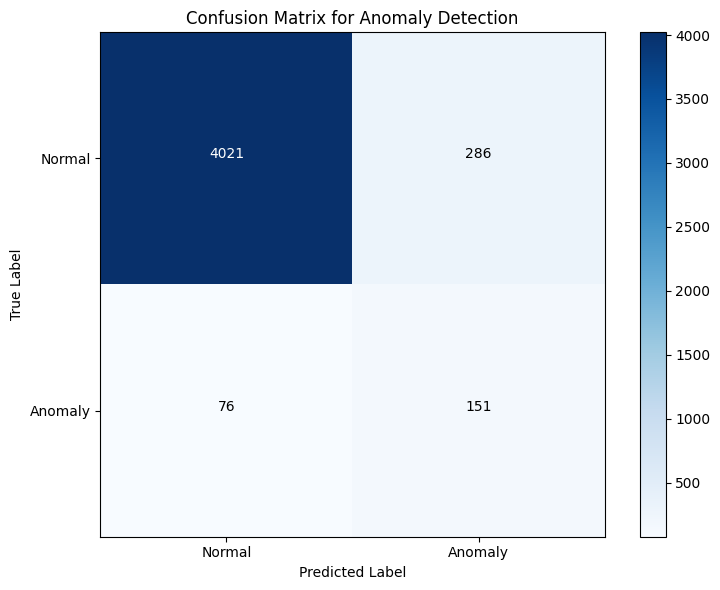

Number of examples flagged by Isolation Forest as anomalies: 227
Number of examples flagged by Z-Score as anomalies: 437


,anomaly_iso_forest,anomaly_zscore
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.metrics import confusion_matrix

# Assuming df is your DataFrame with the necessary columns

# 1. Anomaly Detection using Isolation Forest (In-Built Library)
iso_forest = IsolationForest(contamination=0.05, random_state=42)
df['anomaly_iso_forest'] = iso_forest.fit_predict(X)  # X is your feature set
# -1 indicates anomalies, 1 indicates normal
df['anomaly_iso_forest'] = df['anomaly_iso_forest'].map({-1: 1, 1: 0})

# Count anomalies detected by Isolation Forest
num_anomalies_iso = df['anomaly_iso_forest'].sum()
print(f"Number of anomalies detected by Isolation Forest: {num_anomalies_iso}")

# 2. Anomaly Detection using Z-Score Method (Custom Algorithm)
# Calculate z-scores
z_scores = np.abs((X - X.mean()) / X.std())
threshold = 3  # Define a threshold for z-scores

# Detect anomalies based on z-scores
df['anomaly_zscore'] = (z_scores > threshold).any(axis=1).astype(int)

# Count anomalies detected by Z-Score Method
num_anomalies_zscore = df['anomaly_zscore'].sum()
print(f"Number of anomalies detected by Z-Score method: {num_anomalies_zscore}")

# 3. Compare Results: Create a confusion matrix
# True anomalies from Isolation Forest vs. Z-Score
cm = confusion_matrix(df['anomaly_iso_forest'], df['anomaly_zscore'])

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Anomaly Detection')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Normal', 'Anomaly'])
plt.yticks(tick_marks, ['Normal', 'Anomaly'])

# Loop over data dimensions and create text annotations.
thresh = cm.max() / 2.
for i, j in np.ndindex(cm.shape):
    plt.text(j, i, cm[i, j],
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

# Print the number of examples flagged by both algorithms
print("Number of examples flagged by Isolation Forest as anomalies:", num_anomalies_iso)
print("Number of examples flagged by Z-Score as anomalies:", num_anomalies_zscore)
df[['anomaly_iso_forest',"anomaly_zscore"]].head()
